### Imports

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Data

In [57]:
train = pd.read_csv('../datasets/train.csv')
test = pd.read_csv('../datasets/test.csv')
sample = pd.read_csv('../datasets/sample_sub_reg.csv')

#Chatgpt to find out how to see all the rows and columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### Training data cleaning

In [58]:
train

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
0,109,533352170,60,RL,NaN,13517,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Sawyer,RRAe,Norm,1Fam,2Story,6,8,1976,2005,Gable,CompShg,HdBoard,Plywood,BrkFace,289.0,Gd,TA,CBlock,TA,TA,No,GLQ,533.0,Unf,0.0,192.0,725.0,GasA,Ex,Y,SBrkr,725,754,0,1479,0.0,0.0,2,1,3,1,Gd,6,Typ,0,NaN,Attchd,1976.0,RFn,2.0,475.0,TA,TA,Y,0,44,0,0,0,0,NaN,NaN,NaN,0,3,2010,WD,130500
1,544,531379050,60,RL,43.0,11492,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,SawyerW,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,VinylSd,VinylSd,BrkFace,132.0,Gd,TA,PConc,Gd,TA,No,GLQ,637.0,Unf,0.0,276.0,913.0,GasA,Ex,Y,SBrkr,913,1209,0,2122,1.0,0.0,2,1,4,1,Gd,8,Typ,1,TA,Attchd,1997.0,RFn,2.0,559.0,TA,TA,Y,0,74,0,0,0,0,NaN,NaN,NaN,0,4,2009,WD,220000
2,153,535304180,20,RL,68.0,7922,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,7,1953,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,Gd,CBlock,TA,TA,No,GLQ,731.0,Unf,0.0,326.0,1057.0,GasA,TA,Y,SBrkr,1057,0,0,1057,1.0,0.0,1,0,3,1,Gd,5,Typ,0,NaN,Detchd,1953.0,Unf,1.0,246.0,TA,TA,Y,0,52,0,0,0,0,NaN,NaN,NaN,0,1,2010,WD,109000
3,318,916386060,60,RL,73.0,9802,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,2Story,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,384.0,384.0,GasA,Gd,Y,SBrkr,744,700,0,1444,0.0,0.0,2,1,3,1,TA,7,Typ,0,NaN,BuiltIn,2007.0,Fin,2.0,400.0,TA,TA,Y,100,0,0,0,0,0,NaN,NaN,NaN,0,4,2010,WD,174000
4,255,906425045,50,RL,82.0,14235,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1.5Fin,6,8,1900,1993,Gable,CompShg,Wd Sdng,Plywood,None,0.0,TA,TA,PConc,Fa,Gd,No,Unf,0.0,Unf,0.0,676.0,676.0,GasA,TA,Y,SBrkr,831,614,0,1445,0.0,0.0,2,0,3,1,TA,6,Typ,0,NaN,Detchd,1957.0,Unf,2.0,484.0,TA,TA,N,0,59,0,0,0,0,NaN,NaN,NaN,0,3,2010,WD,138500
5,138,535126040,20,RL,137.0,16492,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,PosA,Norm,1Fam,1Story,6,6,1966,2002,Gable,CompShg,BrkFace,Plywood,None,0.0,Gd,TA,CBlock,TA,TA,No,ALQ,247.0,Rec,713.0,557.0,1517.0,GasA,Ex,Y,SBrkr,1888,0,0,1888,0.0,0.0,2,1,2,1,Gd,6,Mod,1,Gd,Attchd,1966.0,Fin,2.0,578.0,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,190000
6,2827,908186070,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SFoyer,6,5,2005,2006,Gable,CompShg,VinylSd,VinylSd,BrkFace,82.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547.0,Unf,0.0,0.0,547.0,GasA,Gd,Y,SBrkr,1072,0,0,1072,1.0,0.0,2,0,2,1,TA,5,Typ,0,NaN,Basment,2005.0,Fin,2.0,525.0,TA,TA,Y,0,44,0,0,0,0,NaN,NaN,NaN,0,6,2006,New,140000
7,145,535154050,20,RL,NaN,12160,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,5,1959,1959,Hip,CompShg,Plywood,Plywood,BrkFace,180.0,TA,TA,CBlock,TA,TA,No,Rec,1000.0,Unf,0.0,188.0,1188.0,GasA,Fa,Y,SBrkr,1188,0,0,1188,1.0,0.0,1,0,3,1,TA,6,Typ,0,NaN,Attchd,1959.0,RFn,2.0,531.0,TA,TA,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,5,2010,COD,142000
8,1942,535353130,20,RL,NaN,15783,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1Story,5,5,1952,1952,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,292.0,Unf,0.0,632.0,924.0,GasA,TA,Y,SBrkr,924,0,0,924,0.0,0.0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1952.0,Unf,1.0,420.0,TA,TA,Y,

In [73]:
train.dtypes

Id                      int64
PID                     int64
MS SubClass             int64
MS Zoning              object
Lot Frontage          float64
Lot Area                int64
Street                 object
Alley                  object
Lot Shape              object
Land Contour           object
Utilities              object
Lot Config             object
Land Slope             object
Neighborhood           object
Condition 1            object
Condition 2            object
Bldg Type              object
Overall Qual            int64
Overall Cond            int64
Year Built              int64
Year Remod/Add          int64
Roof Style             object
Roof Matl              object
Exterior 1st           object
Exterior 2nd           object
Mas Vnr Type           object
Mas Vnr Area          float64
Exter Qual             object
Exter Cond             object
Foundation             object
Bsmt Qual              object
Bsmt Cond              object
Bsmt Exposure          object
BsmtFin Ty

In [71]:
train['Overall Qual'].value_counts()

5     563
6     506
7     431
8     250
4     159
9      77
3      29
10     23
2       9
1       4
Name: Overall Qual, dtype: int64

In [30]:
train.isnull().sum()

Id                0
PID               0
MS SubClass       0
MS Zoning         0
Lot Frontage    330
               ... 
Misc Val          0
Mo Sold           0
Yr Sold           0
Sale Type         0
SalePrice         0
Length: 81, dtype: int64

In [31]:
# Happy to drop these columns as I didn't believe these would have a huge impact in the SalePrice
train = train.drop(columns =['Lot Frontage', 'Misc Feature', 'Fence', 'Pool QC',
                             'Fireplace Qu','Alley'])
null = train.isnull().sum()
print(null)

Id             0
PID            0
MS SubClass    0
MS Zoning      0
Lot Area       0
              ..
Misc Val       0
Mo Sold        0
Yr Sold        0
Sale Type      0
SalePrice      0
Length: 75, dtype: int64


In [32]:
train

,Id,PID,MS SubClass,MS Zoning,Lot Area,Street,Lot Shape,Land Contour,Utilities,Lot Config,...,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
0,109,533352170,60,RL,13517,Pave,IR1,Lvl,AllPub,CulDSac,...,44,0,0,0,0,0,3,2010,WD,130500
1,544,531379050,60,RL,11492,Pave,IR1,Lvl,AllPub,CulDSac,...,74,0,0,0,0,0,4,2009,WD,220000
2,153,535304180,20,RL,7922,Pave,Reg,Lvl,AllPub,Inside,...,52,0,0,0,0,0,1,2010,WD,109000
3,318,916386060,60,RL,9802,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,0,4,2010,WD,174000
4,255,906425045,50,RL,14235,Pave,IR1,Lvl,AllPub,Inside,...,59,0,0,0,0,0,3,2010,WD,138500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2046,1587,921126030,20,RL,11449,Pave,IR1,HLS,AllPub,Inside,...,276,0,0,0,0,0,1,2008,WD,298751
2047,785,905377130,30,RL,12342,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,0,3,2009,WD,82500
2048,916,909253010,50,RL,7558,Pave,Reg,Bnk,AllPub,Inside,...,0,0,0,0,0,0,3,2009,WD,177000
2049,639,535179160,20,RL,10400,Pave,Reg,Lvl,AllPub,Corner,...,189,140,0,0,0,0,11,2009,WD,144000


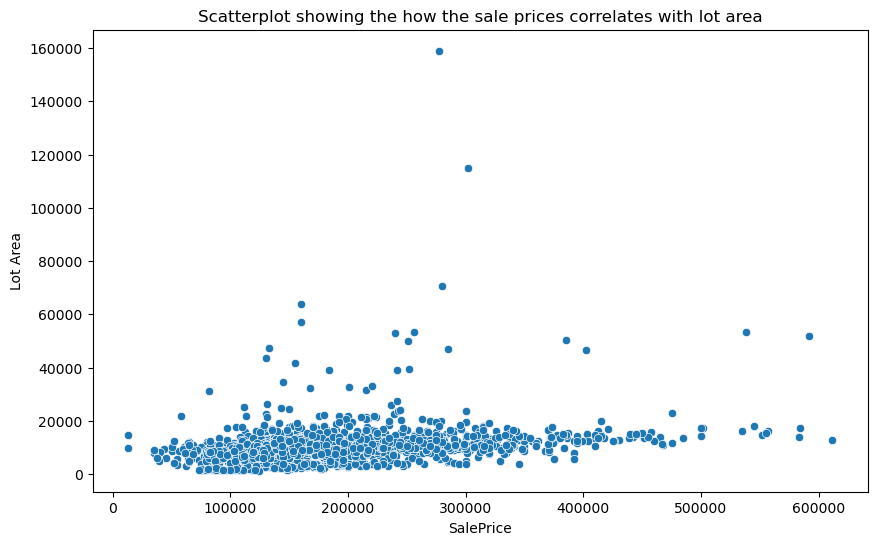

In [103]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='SalePrice', y='Lot Area', data=train)
plt.title('Scatterplot showing the how the sale prices correlates with lot area')
plt.savefig('../Graphs/LotArea_SalePrice', dpi=600)

#### 1st Selection of columns to see how they correlate with Sale Price

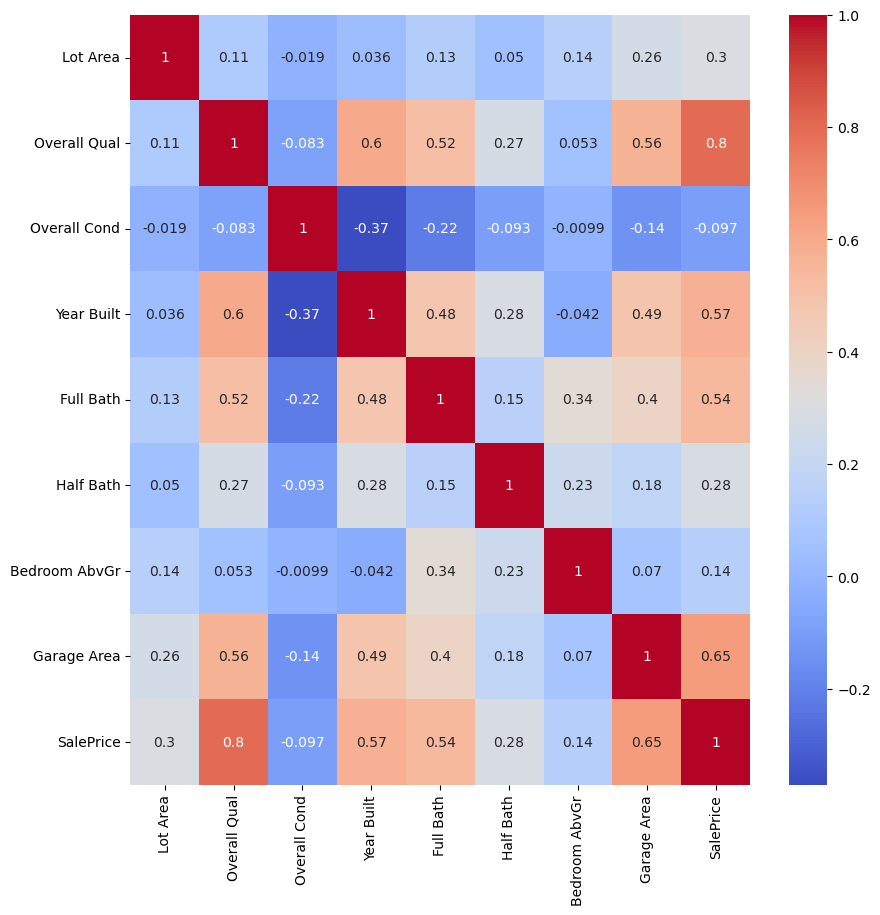

In [104]:
selected_train = train[['Lot Area','Overall Qual','Overall Cond','Year Built','Full Bath',
                      'Half Bath', 'Bedroom AbvGr', 'Garage Area', 'SalePrice']]
plt.figure(figsize=(10,10))
sns.heatmap(selected_train.corr(), cmap='coolwarm', annot=True);
plt.savefig('../Graphs/first selected heatmap', dpi=900)

The heatmap helps identify that Overall Quality, Garage Area, Year Built and Full bath have a strong correlation with the Sale Price

#### 2nd Selection of Columns to see how they correlate with Sale Price

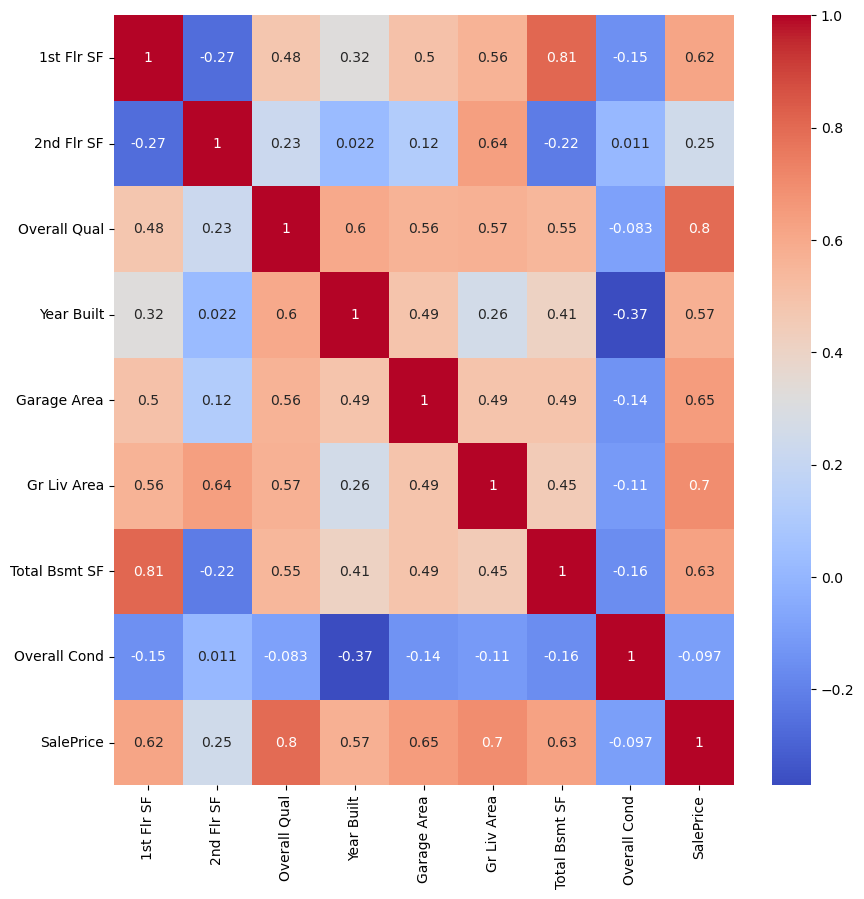

In [106]:
selec2_train = train[['1st Flr SF', '2nd Flr SF', 'Overall Qual', 'Year Built', 'Garage Area',
                     'Gr Liv Area', 'Total Bsmt SF', 'Overall Cond', 'SalePrice']]
plt.figure(figsize=(10,10))
sns.heatmap(selec2_train.corr(), cmap='coolwarm', annot=True);
plt.savefig('../Graphs/2nd_selecteddata', dpi=900)

This second heatmap, has helped identify in addition to the columns mentioned above Gr Liv Area(Ground Living Area), Total Bsmt (Basement) SF and 1st Floor SF have a strong correlation with Sale Price, making them good columns to use for creating our model and predicting our sale prices

#### Looking at how Style of house correlates with the Sale Price

In [65]:
train = pd.get_dummies(train, columns=['House Style'], drop_first=True)

In [66]:
train

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice,House Style_1.5Unf,House Style_1Story,House Style_2.5Fin,House Style_2.5Unf,House Style_2Story,House Style_SFoyer,House Style_SLvl
0,109,533352170,60,RL,NaN,13517,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Sawyer,RRAe,Norm,1Fam,6,8,1976,2005,Gable,CompShg,HdBoard,Plywood,BrkFace,289.0,Gd,TA,CBlock,TA,TA,No,GLQ,533.0,Unf,0.0,192.0,725.0,GasA,Ex,Y,SBrkr,725,754,0,1479,0.0,0.0,2,1,3,1,Gd,6,Typ,0,NaN,Attchd,1976.0,RFn,2.0,475.0,TA,TA,Y,0,44,0,0,0,0,NaN,NaN,NaN,0,3,2010,WD,130500,0,0,0,0,1,0,0
1,544,531379050,60,RL,43.0,11492,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,SawyerW,Norm,Norm,1Fam,7,5,1996,1997,Gable,CompShg,VinylSd,VinylSd,BrkFace,132.0,Gd,TA,PConc,Gd,TA,No,GLQ,637.0,Unf,0.0,276.0,913.0,GasA,Ex,Y,SBrkr,913,1209,0,2122,1.0,0.0,2,1,4,1,Gd,8,Typ,1,TA,Attchd,1997.0,RFn,2.0,559.0,TA,TA,Y,0,74,0,0,0,0,NaN,NaN,NaN,0,4,2009,WD,220000,0,0,0,0,1,0,0
2,153,535304180,20,RL,68.0,7922,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,5,7,1953,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,Gd,CBlock,TA,TA,No,GLQ,731.0,Unf,0.0,326.0,1057.0,GasA,TA,Y,SBrkr,1057,0,0,1057,1.0,0.0,1,0,3,1,Gd,5,Typ,0,NaN,Detchd,1953.0,Unf,1.0,246.0,TA,TA,Y,0,52,0,0,0,0,NaN,NaN,NaN,0,1,2010,WD,109000,0,1,0,0,0,0,0
3,318,916386060,60,RL,73.0,9802,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,384.0,384.0,GasA,Gd,Y,SBrkr,744,700,0,1444,0.0,0.0,2,1,3,1,TA,7,Typ,0,NaN,BuiltIn,2007.0,Fin,2.0,400.0,TA,TA,Y,100,0,0,0,0,0,NaN,NaN,NaN,0,4,2010,WD,174000,0,0,0,0,1,0,0
4,255,906425045,50,RL,82.0,14235,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,6,8,1900,1993,Gable,CompShg,Wd Sdng,Plywood,None,0.0,TA,TA,PConc,Fa,Gd,No,Unf,0.0,Unf,0.0,676.0,676.0,GasA,TA,Y,SBrkr,831,614,0,1445,0.0,0.0,2,0,3,1,TA,6,Typ,0,NaN,Detchd,1957.0,Unf,2.0,484.0,TA,TA,N,0,59,0,0,0,0,NaN,NaN,NaN,0,3,2010,WD,138500,0,0,0,0,0,0,0
5,138,535126040,20,RL,137.0,16492,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,PosA,Norm,1Fam,6,6,1966,2002,Gable,CompShg,BrkFace,Plywood,None,0.0,Gd,TA,CBlock,TA,TA,No,ALQ,247.0,Rec,713.0,557.0,1517.0,GasA,Ex,Y,SBrkr,1888,0,0,1888,0.0,0.0,2,1,2,1,Gd,6,Mod,1,Gd,Attchd,1966.0,Fin,2.0,578.0,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,190000,0,1,0,0,0,0,0
6,2827,908186070,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,6,5,2005,2006,Gable,CompShg,VinylSd,VinylSd,BrkFace,82.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547.0,Unf,0.0,0.0,547.0,GasA,Gd,Y,SBrkr,1072,0,0,1072,1.0,0.0,2,0,2,1,TA,5,Typ,0,NaN,Basment,2005.0,Fin,2.0,525.0,TA,TA,Y,0,44,0,0,0,0,NaN,NaN,NaN,0,6,2006,New,140000,0,0,0,0,0,1,0
7,145,535154050,20,RL,NaN,12160,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,5,5,1959,1959,Hip,CompShg,Plywood,Plywood,BrkFace,180.0,TA,TA,CBlock,TA,TA,No,Rec,1000.0,Unf,0.0,188.0,1188.0,GasA,Fa,Y,SBrkr,1188,0,0,1188,1.0,0.0,1,0,3,1,TA,6,Typ,0,NaN,Attchd,1959.0,RFn,2.0,531.0,TA,TA,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,5,2010,COD,142000,0,1,0,0,0,0,0
8,1942,535353130,20,RL,NaN,15783,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,5,5,1952,1952,Gable,CompShg,Wd S

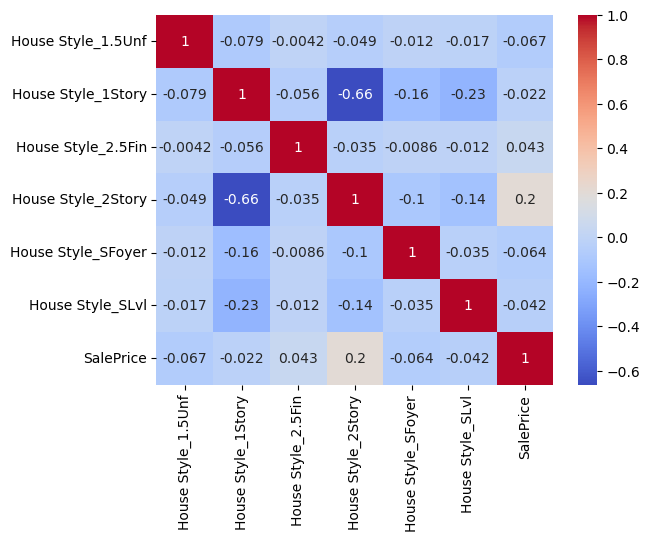

In [67]:
type_train = train[['House Style_1.5Unf','House Style_1Story', 'House Style_2.5Fin', 'House Style_2Story',
                     'House Style_SFoyer', 'House Style_SLvl', 'SalePrice']]
sns.heatmap(type_train.corr(), cmap = 'coolwarm', annot=True);

When looking at the heatmap we can see that the style of house had very little correlation with the price of the house, which is why I decided not to include it within my model.

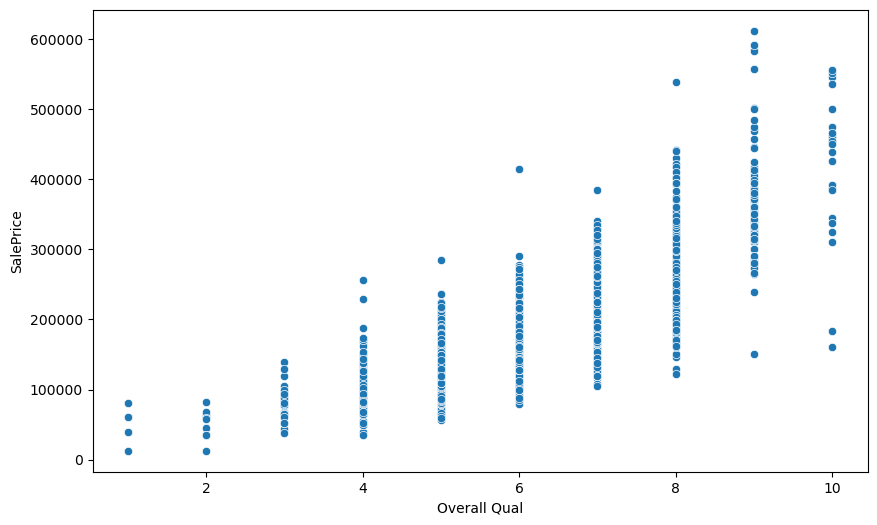

In [97]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='Overall Qual', y='SalePrice', data=train)

plt.savefig('../Graphs/Overall Quality against Sale Price', dpi=600)

The scatterplot helps show that as the Overall Quality goes up and the Salesprice also increases. Highlighting the positive correlation between the 2.

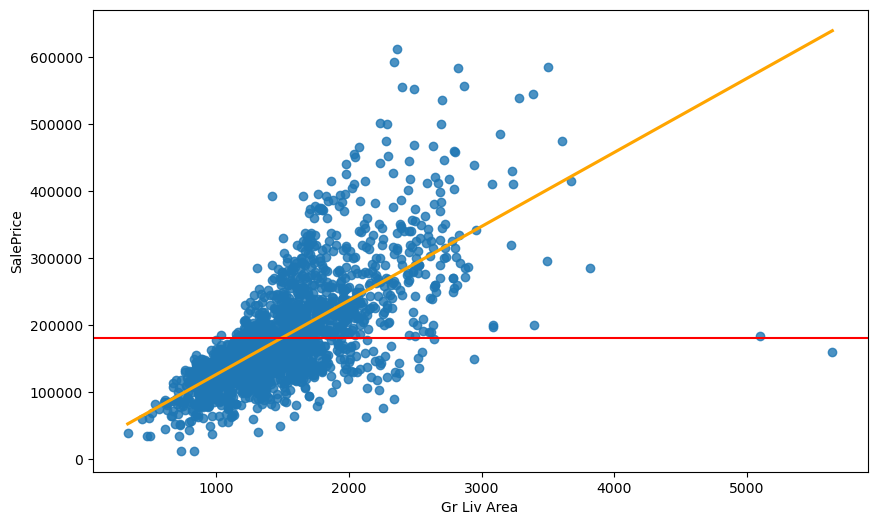

In [107]:
plt.figure(figsize=(10,6))
sns.regplot(x='Gr Liv Area', y='SalePrice', data=train, ci=None, line_kws={'color':'orange'})
null_predpric = train['SalePrice'].mean()
plt.axhline(null_predpric, color='red')
plt.savefig('../Graphs/Grlivearea_saleprice', dpi=900)

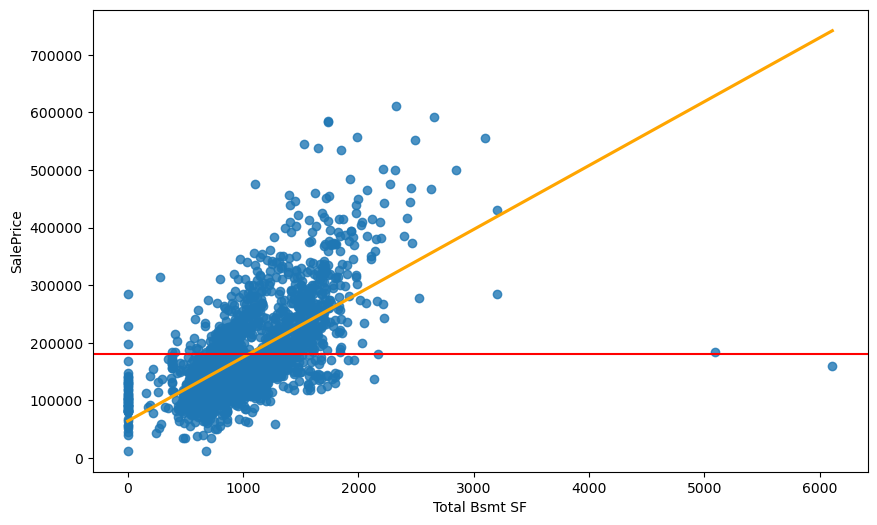

In [108]:
plt.figure(figsize=(10,6))
sns.regplot(x='Total Bsmt SF', y='SalePrice', data=train, ci=None, line_kws={'color':'orange'})
null_predpric = train['SalePrice'].mean()
plt.axhline(null_predpric, color='red')
plt.savefig('../Graphs/totalbsmt_saleprice', dpi=900)

The two graphs above help show the correlation between total basement SF, ground living area and sales price. With both graphs show the positive correlation that we identified in the heatmaps, with both also showing a few outliers which can be due to other parameters contributing to the sale price. The total bsmt graph helps support this when we looking at the properties that are recorded as having 0 basement area but their price still increasing.

### Final Selected columns for training data

In [80]:
finaltrain = train[['Id','Overall Qual', 'Year Built', 'Full Bath', 'Half Bath', 'Garage Area',
                   'Total Bsmt SF', 'Gr Liv Area', '1st Flr SF', '2nd Flr SF', 'SalePrice']]

missing= finaltrain.isnull().any(axis=1)
missing_values = train[missing]
print(missing_values)

        Id        PID  MS SubClass MS Zoning  Lot Frontage  Lot Area Street  \
1327  1342  903230120           20        RM          99.0      5940   Pave   
1712  2237  910201180           70        RM          50.0      9060   Pave   

     Alley Lot Shape Land Contour Utilities Lot Config Land Slope  \
1327   NaN       IR1          Lvl    AllPub        FR3        Gtl   
1712   NaN       Reg          Lvl    AllPub     Inside        Gtl   

     Neighborhood Condition 1 Condition 2 Bldg Type  Overall Qual  \
1327      BrkSide       Feedr        Norm      1Fam             4   
1712       IDOTRR        Norm        Norm      1Fam             5   

      Overall Cond  Year Built  Year Remod/Add Roof Style Roof Matl  \
1327             7        1946            1950      Gable   CompShg   
1712             6        1923            1999      Gable   CompShg   

     Exterior 1st Exterior 2nd Mas Vnr Type  Mas Vnr Area Exter Qual  \
1327      MetalSd       CBlock         None           0.0   

In [86]:
# As there is limited data on these parameters I decided to set these to 0
finaltrain['Garage Area'].fillna(0, inplace=True)
finaltrain['Total Bsmt SF'].fillna(0, inplace=True)

/var/folders/pj/jq7g3ftn5557342n7bvxr3q80000gn/T/ipykernel_78405/1388683097.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  finaltrain['Garage Area'].fillna(0, inplace=True)
/var/folders/pj/jq7g3ftn5557342n7bvxr3q80000gn/T/ipykernel_78405/1388683097.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  finaltrain['Total Bsmt SF'].fillna(0, inplace=True)


In [82]:
finaltrain.to_csv('../datasets/Selected_train_data.csv', index=False)

### Exploring Neighbourhood

In [46]:
train = pd.get_dummies(train, columns=['Neighborhood'], drop_first=True)

In [47]:
train.head()

,Id,PID,MS SubClass,MS Zoning,Lot Area,Street,Lot Shape,Land Contour,Utilities,Lot Config,...,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker
0,109,533352170,60,RL,13517,Pave,IR1,Lvl,AllPub,CulDSac,...,0,0,0,0,1,0,0,0,0,0
1,544,531379050,60,RL,11492,Pave,IR1,Lvl,AllPub,CulDSac,...,0,0,0,0,0,1,0,0,0,0
2,153,535304180,20,RL,7922,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,0,0,0,0,0
3,318,916386060,60,RL,9802,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,0,0,0,1,0
4,255,906425045,50,RL,14235,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,1,0,0,0,0


<Axes: >

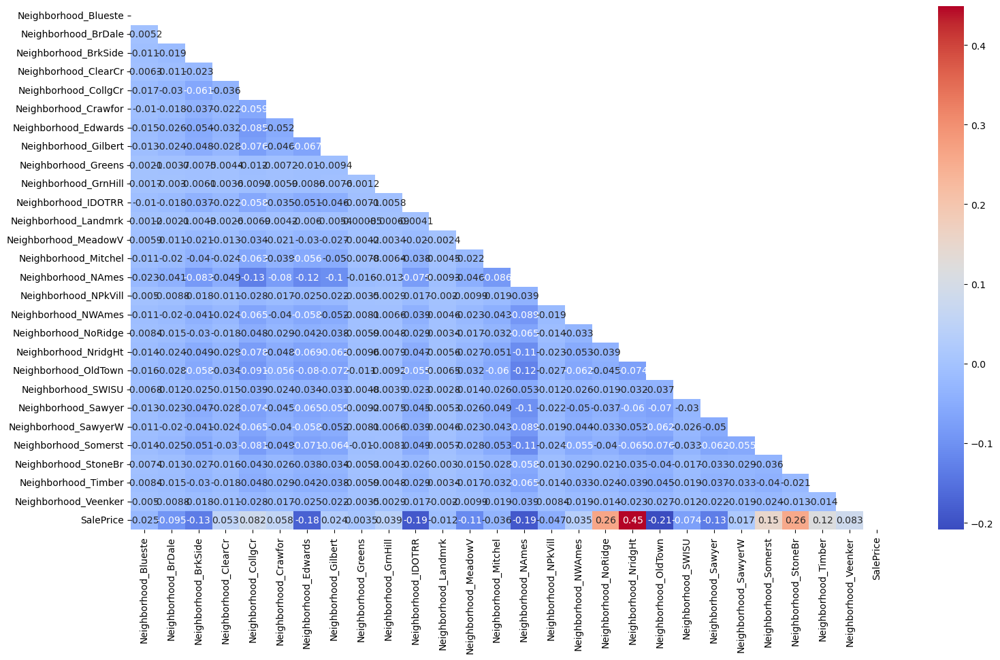

In [48]:
trainNeigh = train[['Neighborhood_Blueste', 'Neighborhood_BrDale', 'Neighborhood_BrkSide',
                   'Neighborhood_ClearCr', 'Neighborhood_CollgCr', 'Neighborhood_Crawfor',
                   'Neighborhood_Edwards', 'Neighborhood_Gilbert', 'Neighborhood_Greens',
                   'Neighborhood_GrnHill', 'Neighborhood_IDOTRR', 'Neighborhood_Landmrk',
                   'Neighborhood_MeadowV', 'Neighborhood_Mitchel', 'Neighborhood_NAmes',
                   'Neighborhood_NPkVill', 'Neighborhood_NWAmes', 'Neighborhood_NoRidge',
                   'Neighborhood_NridgHt', 'Neighborhood_OldTown', 'Neighborhood_SWISU',
                   'Neighborhood_Sawyer', 'Neighborhood_SawyerW', 'Neighborhood_Somerst',
                   'Neighborhood_StoneBr', 'Neighborhood_Timber', 'Neighborhood_Veenker',
                   'SalePrice']]
plt.figure(figsize=(18,10))
mask = np.zeros_like(trainNeigh.corr())
mask[np.triu_indices_from(mask)] = True
sns.heatmap(trainNeigh.corr(), mask=mask, cmap='coolwarm', annot=True)

### Testing Data Cleaning

In [83]:
def test_cleaning(df):
    df = df.drop(columns=['Lot Frontage', 'Misc Feature', 'Fence', 'Pool QC', 'Fireplace Qu',
                        'Alley'])
    df['FbathxHbath'] = df['Full Bath'] * df['Half Bath']
    finaltest = df[['Id','Overall Qual', 'Year Built', 'Full Bath','Half Bath','Garage Area',
                     'Total Bsmt SF', 'Gr Liv Area', '1st Flr SF', '2nd Flr SF','FbathxHbath']]
   
    return finaltest

In [84]:
finaltest1 = test_cleaning(test)

In [85]:
finaltest1.to_csv('../datasets/Selected_test_data1.csv', index=False)